# Identify appropriate radius of gyration to filter backbones
- Find the ones with extreme ROG values and visualize them

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import py3Dmol
import random

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

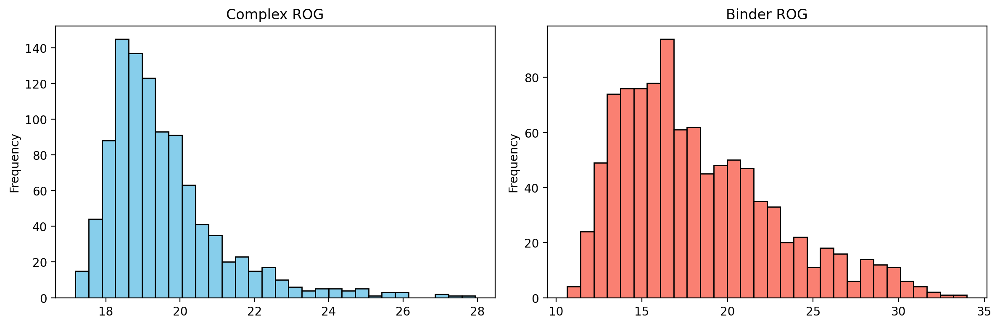

In [2]:
data = pd.read_csv('/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/rg.csv')

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

axes[0].hist(data['complex_Rg'], bins=30, color='skyblue', edgecolor='black')
axes[0].set_title('Complex ROG')
axes[0].set_ylabel('Frequency')

axes[1].hist(data['binder_Rg'], bins=30, color='salmon', edgecolor='black')
axes[1].set_title('Binder ROG')
axes[1].set_ylabel('Frequency')

plt.tight_layout()


plt.show()

<Axes: xlabel='complex_Rg', ylabel='binder_Rg'>

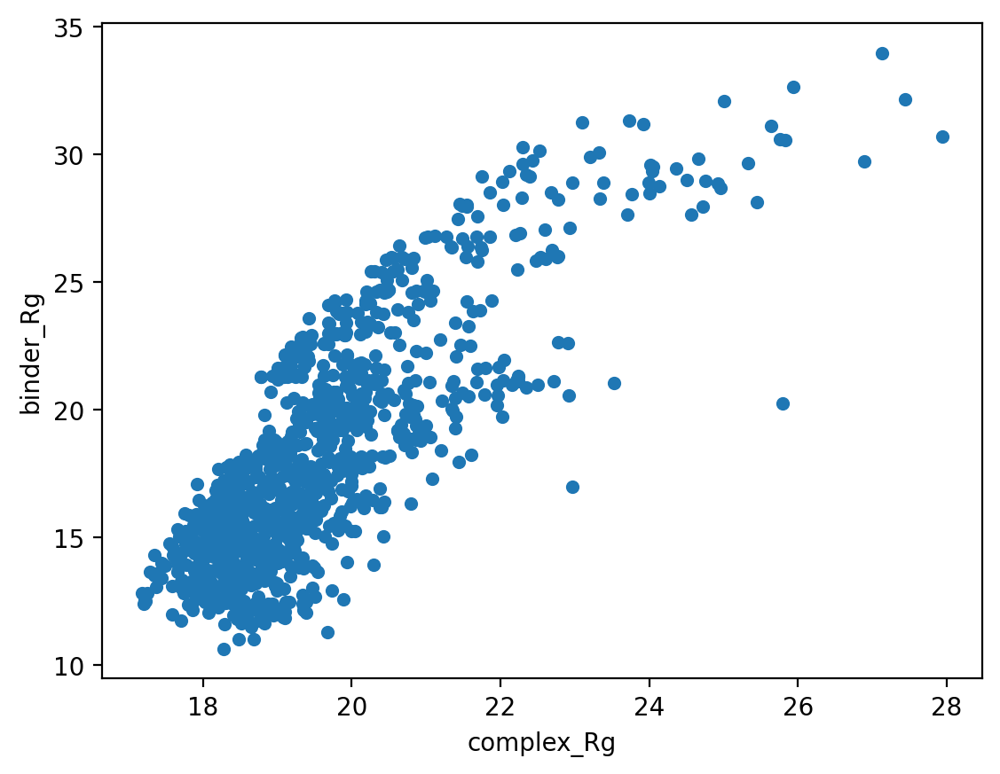

In [3]:
data.plot.scatter(x='complex_Rg', y='binder_Rg')

Visualize the ROG values and the corresponding pdb structures to decide on the filtering threshold by ROG
- Trying complex ROG and binder ROG

In [6]:
def view_multiple(pdbs, n=9, cols=3):
    rows = (len(pdbs) + cols - 1) // cols
    
    view = py3Dmol.view(
        viewergrid=(rows, cols),
        width=300 * cols,
        height=300 * rows
    )
    for i, pdb_path in enumerate(pdbs):
        with open(pdb_path) as f:
            pdb_data = f.read()
        row, col = divmod(i, cols)
        view.addModel(pdb_data, "pdb", viewer=(row, col))
        view.setStyle({"cartoon": {"color": "spectrum"}}, viewer=(row, col))
        view.zoomTo(viewer=(row, col))
    return view.show()

In [22]:
data[data['complex_Rg']>22].sort_values(by='complex_Rg', ascending=False)

,pdb_path,complex_Rg,binder_Rg
296,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_275.pdb,27.94,30.71
772,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_182.pdb,27.44,32.18
212,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_2.pdb,27.13,33.98
10,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/100/_18.pdb,26.89,29.75
213,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_20.pdb,25.94,32.64
880,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_28.pdb,25.83,30.58
905,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_32.pdb,25.79,20.25
761,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_172.pdb,25.76,30.60
223,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_209.pdb,25.64,31.14
834,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_238.pdb,25.45,28.13


In [25]:
data[data['complex_Rg']<18].sort_values(by='complex_Rg', ascending=True)

,pdb_path,complex_Rg,binder_Rg
901,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_299.pdb,17.18,12.83
318,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_44.pdb,17.20,12.40
811,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_217.pdb,17.22,12.53
824,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_229.pdb,17.23,12.50
980,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_4/_1.pdb,17.25,12.84
177,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_168.pdb,17.29,13.64
503,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_21.pdb,17.34,13.51
752,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_164.pdb,17.35,14.32
542,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_245.pdb,17.36,13.57
282,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_262.pdb,17.37,13.08


In [17]:
view_multiple(
    data[data['complex_Rg']>22].sort_values(by='complex_Rg', ascending=False)['pdb_path'].to_list()
)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Check manually a few cases where the Rg's are off diagonal in the scatterplot

In [24]:
view_multiple(["/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_32.pdb", "/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_172.pdb"])

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

**Conclusions:**

If binder Rg is much smaller than the complex Rg, it can indicate that the binder is off to the side of the target

If binder Rg is much bigger than the complex Rg, it can indicate that the binder is one long helix

Actually sampled 100 structures to reach the conclusions below, but only putting 10 in the code below to minimize file size

In [13]:
seed_value = 32
random.seed(seed_value)
pandas_sample = data[(data['complex_Rg']>=18) & (data['complex_Rg']<22)].sample(n=10, random_state=seed_value)
pandas_sample_sorted = pandas_sample.sort_values(by='complex_Rg', ascending=True)
pandas_sample_sorted

,pdb_path,complex_Rg,binder_Rg
269,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_250.pdb,18.77,14.72
748,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_160.pdb,18.79,14.75
339,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_63.pdb,19.04,15.55
705,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_121.pdb,19.47,20.23
294,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_273.pdb,19.95,19.85
749,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_161.pdb,20.04,15.27
299,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_278.pdb,20.13,23.46
99,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/100/_99.pdb,20.87,22.29
14,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/100/_21.pdb,20.93,18.78
359,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_81.pdb,21.34,20.95


In [14]:
view_multiple(
    pandas_sample_sorted['pdb_path'].to_list()
)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

**Conclusions:**

May be better to look at binder ROG, as the complex ROG also has the target

In [42]:
data[data['binder_Rg']<=13].sort_values(by='binder_Rg', ascending=True)

,pdb_path,complex_Rg,binder_Rg
855,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_257.pdb,18.28,10.64
307,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_34.pdb,18.68,11.00
383,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_101.pdb,18.48,11.03
8,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/100/_16.pdb,19.67,11.30
442,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_155.pdb,18.64,11.52
108,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_105.pdb,18.29,11.60
565,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_266.pdb,18.82,11.64
351,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_74.pdb,18.52,11.65
694,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_111.pdb,17.70,11.74
155,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_148.pdb,18.75,11.74


In [47]:
len(data[data['binder_Rg']<=13])

79

In [16]:
len(data[data['binder_Rg']>23])

151

In [21]:
view_multiple(
    data[data['binder_Rg']<=12].sort_values(by='binder_Rg', ascending=True)['pdb_path'].to_list()[:-10]
)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

**Conclusions:**

All look too compact to effectively interact with the peptide and the MHC

**Omitted due to file size:**

binders with ROG more than 23 tend to be one big long helix, which can't form good interactions with the peptide and the MHC at the same time

Actually sampled 100 structures to reach the conclusions below, but only putting 10 in the code below to minimize file size

In [8]:
seed_value = 32
random.seed(seed_value)
pandas_sample = data[(data['binder_Rg']>=13) & (data['binder_Rg']<23)].sample(n=10, random_state=seed_value)
pandas_sample_sorted_2 = pandas_sample.sort_values(by='binder_Rg', ascending=True)
pandas_sample_sorted_2

,pdb_path,complex_Rg,binder_Rg
736,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_15.pdb,18.15,14.53
920,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_46.pdb,17.55,14.76
408,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_124.pdb,18.34,16.20
320,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_46.pdb,18.43,16.48
471,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_181.pdb,18.56,16.58
715,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_130.pdb,18.54,17.61
741,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_3/_154.pdb,19.63,19.33
579,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_2/_279.pdb,19.86,20.13
48,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/100/_52.pdb,20.31,21.18
119,/n/groups/marks/users/aaron/pmhc/rfdiffusion/outputs/kras/300_1/_115.pdb,21.69,21.60


In [9]:
view_multiple(
    pandas_sample_sorted_2['pdb_path'].to_list()
)

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

**Conclusion:**

Binder ROG 13-23 may be a good range